 - People
    - ID: Customer’s unique identifier
    - Year_Birth: Customer’s birth year
    - Education: Customer’s education level
    - Marital_Status: Customer’s marital status
    - Income: Customer’s yearly household income
    - Kidhome: Number of children in customer’s household
    - Teenhome: Number of teenagers in customer’s household
    - Dt_Customer: Date of customer’s enrollment with the company
    - Recency: Number of days since customer’s last purchase

 - Products
    - MntWines: Amount spent on wine in the last 2 years
    - MntFruits: Amount spent on fruits in the last 2 years
    - MntMeatProducts: Amount spent on meat in the last 2 years
    - MntFishProducts: Amount spent on fish in the last 2 years
    - MntSweetProducts: Amount spent on sweets in the last 2 years
    - MntGoldProds: Amount spent on gold in the last 2 years

 - Place
    - NumDealsPurchases: Number of purchases made with a discount
    - NumWebPurchases: Number of purchases made through the company’s web site
    - NumCatalogPurchases: Number of purchases made using a catalogue
    - NumStorePurchases: Number of purchases made directly in stores
    - NumWebVisitsMonth: Number of visits to company’s web site in the last month

 - Promotion
    - AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
    - AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
    - AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
    - AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
    - AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
    - Response: 1 if customer accepted the offer in the last campaign, 0 otherwise

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Loading the Dataset
df = pd.read_csv("D:/Projects/Cutomer Personality Analysis/Customer Personality Analysis Dataset_CSV.csv")

# Visibility of ALL the Columns
pd.set_option('display.max_columns', None)

# Seeing the random 5 rows of the datsaet
df.sample(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
1311,8427,1956,Master,Single,64857.0,0,0,23-11-2012,78,556,14,717,210,0,43,1,7,5,10,4,0,0,0,0,0,0,3,11,0
1432,9349,1985,Graduation,Married,92533.0,0,0,19-12-2013,84,693,21,118,110,147,42,1,6,5,11,2,0,0,1,1,0,0,3,11,0
32,5710,1970,Graduation,Together,40548.0,0,1,10-10-2012,31,110,0,5,2,0,3,2,2,1,4,5,0,1,0,0,0,0,3,11,0
2090,4865,1974,Master,Divorced,53367.0,1,1,31-08-2013,2,229,7,140,10,3,11,7,5,1,8,7,0,0,0,0,0,0,3,11,1
1584,4608,1987,Graduation,Divorced,81361.0,0,0,25-02-2014,18,163,23,424,27,65,76,1,3,10,13,1,0,0,0,0,0,0,3,11,1


In [3]:
df['Response'].unique()

array([1, 0], dtype=int64)

In [4]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [5]:
# defining a function to describe the Descriptive Stats of the Features
def basic_info_dataset(df):
    print("Dataset has ", df.shape[1], " columns and ", df.shape[0], " rows.")
    print("Dataset has ", df[df.duplicated()].shape[0], " duplicated rows.")
    print(" ")
    print("Descriptive statistics of the numeric features in the dataset :- ")
    print(" ")
    print(df.describe())
    print(" ")
    print("Basic Information of the Dataset :- ")
    print(" ")
    print(df.info())

In [6]:
basic_info_dataset(df)

Dataset has  29  columns and  2240  rows.
Dataset has  0  duplicated rows.
 
Descriptive statistics of the numeric features in the dataset :- 
 
                 ID   Year_Birth         Income      Kidhome     Teenhome  \
count   2240.000000  2240.000000    2216.000000  2240.000000  2240.000000   
mean    5592.159821  1968.805804   52247.251354     0.444196     0.506250   
std     3246.662198    11.984069   25173.076661     0.538398     0.544538   
min        0.000000  1893.000000    1730.000000     0.000000     0.000000   
25%     2828.250000  1959.000000   35303.000000     0.000000     0.000000   
50%     5458.500000  1970.000000   51381.500000     0.000000     0.000000   
75%     8427.750000  1977.000000   68522.000000     1.000000     1.000000   
max    11191.000000  1996.000000  666666.000000     2.000000     2.000000   

           Recency     MntWines    MntFruits  MntMeatProducts  \
count  2240.000000  2240.000000  2240.000000      2240.000000   
mean     49.109375   303.935714

In [7]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

### Data Cleaning

In [8]:
df_copy = df.copy()

##### Insights
- The 'Income' column has 23 missing values.
* 'Dt_Customer' column's type is string.

In [9]:
# Filling Null values of 'Income' column with the MEDIAN value
df_copy['Income'].fillna(int(df_copy['Income'].median()), inplace=True)

In [10]:
# Checking the Null value again
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2240 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

*  Converting `Dt_Customer` column's type to the Datetime format.

In [11]:
df_copy.Dt_Customer = pd.to_datetime(df_copy.Dt_Customer)

In [12]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2240 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

In [13]:
# checking for null values throughout the Dataset
df_copy.isna().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

* There are NO null values.

In [14]:
(df_copy=='unknown').sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

In [15]:
## Check Duplicates
df_copy.duplicated().sum()

0

In [16]:
# Checking the number of uniques values of each columns
df_copy.nunique()

ID                     2240
Year_Birth               59
Education                 5
Marital_Status            8
Income                 1975
Kidhome                   3
Teenhome                  3
Dt_Customer             663
Recency                 100
MntWines                776
MntFruits               158
MntMeatProducts         558
MntFishProducts         182
MntSweetProducts        177
MntGoldProds            213
NumDealsPurchases        15
NumWebPurchases          15
NumCatalogPurchases      14
NumStorePurchases        14
NumWebVisitsMonth        16
AcceptedCmp3              2
AcceptedCmp4              2
AcceptedCmp5              2
AcceptedCmp1              2
AcceptedCmp2              2
Complain                  2
Z_CostContact             1
Z_Revenue                 1
Response                  2
dtype: int64

In [17]:
# unique Values of 'Education' column
df_copy['Education'].unique()

array(['Graduation', 'PhD', 'Master', 'Basic', '2n Cycle'], dtype=object)

In [18]:
df_copy['Education'].value_counts()

Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64

In [19]:
# unique Values of 'Marital_Status' column
unq_val_Marital_Status = (df_copy['Marital_Status'].append(df_copy['Marital_Status'])).unique()
print(unq_val_Marital_Status)

['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO']


In [20]:
# Count figure of unique Values of 'Marital_Status' column
df_copy['Marital_Status'].value_counts()

Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

In [21]:
# unique Values of 'Kidhome' column
unq_val_Kidhome = (df_copy['Kidhome'].append(df_copy['Kidhome'])).unique()
print(unq_val_Kidhome)

[0 1 2]


In [22]:
df_copy['Kidhome'].value_counts()

0    1293
1     899
2      48
Name: Kidhome, dtype: int64

 * There are 1293 customers having NO kids.


In [23]:
unq_val_Teenhome = (df_copy['Teenhome'].append(df_copy['Teenhome'])).unique()
print(unq_val_Teenhome)

[0 1 2]


In [24]:
df_copy['Teenhome'].value_counts()

0    1158
1    1030
2      52
Name: Teenhome, dtype: int64

 * There are 1158 customers having NO teenager.

In [25]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2240 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

##### Insights
 - There are following important points about Features in the dataset :-
     - Education : There are 5 categories, namely ('Graduation', 'PhD', '2n Cycle', 'Master', 'Basic')
     - Marital_Status : There are 8 categories, namely ('Married', 'Single', 'Together', 'Widow', 'Divorced', 'Alone', 'Absurd', 'YOLO')
     - Kidhome : There are 3 categories, namely (0, 1, 2)
     - Teenhome : There are 3 categories, namely (0, 1 ,2)

We can see the definition of each variables except for the Z_CostContact and the Z_Revenue. We should take a look at those variables to see what it really means.

In [26]:
print('\nThe Decription of the Z_CostContact Feature is as follows :\n',df_copy.Z_CostContact.describe())
print('\nThe Decription of the Z_Revenue Feature is as follows :\n',df_copy.Z_Revenue.describe())


The Decription of the Z_CostContact Feature is as follows :
 count    2240.0
mean        3.0
std         0.0
min         3.0
25%         3.0
50%         3.0
75%         3.0
max         3.0
Name: Z_CostContact, dtype: float64

The Decription of the Z_Revenue Feature is as follows :
 count    2240.0
mean       11.0
std         0.0
min        11.0
25%        11.0
50%        11.0
75%        11.0
max        11.0
Name: Z_Revenue, dtype: float64


##### Insights
- Both variables have a constant value throughout the whole dataset.
- Even if we were to keep those variables, they would not contribute on anything at all.-
- We can safely drop 'Z_CostContact' and 'Z_Revenue' features.

In [27]:
# Dropping the 'Z_CostContact' and 'Z_Revenue' features.
df_copy = df_copy.drop(columns=['Z_CostContact','Z_Revenue'], axis=1)

In [28]:
df_copy.sample(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
149,4050,1966,Master,Married,49605.0,0,0,2014-06-21,65,42,16,29,12,20,8,1,2,1,4,3,0,0,0,0,0,0,0
1973,9507,1975,Graduation,Married,40794.0,0,1,2013-07-04,18,261,23,73,4,23,50,2,6,3,5,7,0,0,0,0,0,0,0
1792,7960,1962,2n Cycle,Together,82122.0,0,0,2013-08-15,89,734,22,350,151,25,100,1,3,9,13,1,0,0,1,0,0,0,0
138,7660,1973,PhD,Alone,35860.0,1,1,2014-05-19,37,15,0,8,4,2,20,2,1,1,2,5,1,0,0,0,0,0,1
1872,3722,1972,Graduation,Single,44503.0,1,1,2014-04-16,83,31,1,8,0,0,8,2,2,0,3,6,0,0,0,0,0,0,0


### Final step of Wrangling: Store data

In [29]:
# Store the file
df_copy.reset_index(drop=True)
df_copy.to_csv('Customer_Personality_Analysis_cleaned_df.csv', index=False)

# Exploratory Data Analysis

In [30]:
cleaned_df=df_copy.copy(deep=True)

In [31]:
# Descriptive Statistical analysis of the Dataset
cleaned_df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2240.0,52237.970089,25037.956074,1730.0,35538.75,51381.0,68289.75,666666.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0


##### Insights
- With respect to Standard Deviation :-
    - There is HUGE Spread in 'MntWines' and 'MntMeatProducts' as compared to others in the Dataset.
- With respect to Max value :-
    - The Max amount spent is also considerable in 'MntWines' and 'MntMeatProducts' which is 1493, 1725 respectively.
- With respect to Mean(Average) value :-
    - It is clearly visible that on an average, A customer has spent more amount Firstly for 'Wines' which is 303.935, and Secondly for 'MeatProducts' which is 166.95.

### To get the better results, I'll transform the Dataset with the addition of some new but necessary features :

- (1) - I'll split `Dt_Customer` column's information into 3 different columns, namely `Dt_WeekDay`, `Dt_Month`  and  `Dt_Year`. With these New columns I would be able to analyze the Average Month & the day of the week that an Average person became a customer. It'll help to boost more First time customers when we arrange a campaign on that Day of the week or in that Month.

In [32]:
cleaned_df['Dt_WeekDay'] = pd.DatetimeIndex(cleaned_df['Dt_Customer']).weekday
cleaned_df['Dt_Month'] = pd.DatetimeIndex(cleaned_df['Dt_Customer']).month
cleaned_df['Dt_Year'] = pd.DatetimeIndex(cleaned_df['Dt_Customer']).year

- (2) - It will be benificial to us if we can know that which Age_group is our target Customer.
     - I'm adding a new column 'Age' derived from 'Year_Birth' column.

In [33]:
cleaned_df['Age'] = (2021 - cleaned_df['Year_Birth'])

- (3) - I'll sum up 'Kidhome' and 'Teenhome' column to come up with new column 'Total_Minor_Home'.

In [34]:
cleaned_df['Total_Minors'] = cleaned_df.Kidhome + cleaned_df.Teenhome

- (4) - To analyze the average order volume of each customer, I'll need the following :
     - Total amount spent by the customers. 
         - If I'll add all the columns with amount spent on the different Products, i.e, 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'  then I'll get Total amount spent by the customers.
         - Let say we create a new column 'Total_Spent_Amount' which describes the Total amount spent by the customers. 
     - Total number of purchases by the customers.
         - If I'll add all the columns with number of purchases for the different products by the customers, i.e., 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth'  then I'll get Total number of purchases by the customers.
         - Let say we create a new column 'Total_Purchases' which describes the Total number of purchases by the customers.
     - I'll create a new column 'Avg_Order_Val' to analyze the average order volume of each customer.
         - 'Avg_Order_Val' will be formed simply by dividing 'Total_Amount' column by 'Total_Purchases'.

In [35]:
cleaned_df['Total_Spent_Amount'] = cleaned_df.MntWines + cleaned_df.MntFruits + cleaned_df.MntMeatProducts + cleaned_df.MntFishProducts + cleaned_df.MntSweetProducts + cleaned_df.MntGoldProds
cleaned_df['Total_Purchases'] = cleaned_df.NumDealsPurchases + cleaned_df.NumWebPurchases + cleaned_df.NumCatalogPurchases + cleaned_df.NumStorePurchases + cleaned_df.NumWebVisitsMonth
cleaned_df['Avg_Order_Val'] = cleaned_df.Total_Spent_Amount/cleaned_df.Total_Purchases

- (5) - To analyze the amount that a customer accepted the offer in all the marketing campaigns, I'll sum-up all the columns with accepted offer in the different campaigns, i.e., `AcceptedCmp1`, `AcceptedCmp2`, `AcceptedCmp3`, `AcceptedCmp4`, `AcceptedCmp5`.  It'll help me to analyze the behaviour of the different campaigns.
     - I'll be creating a new column `Total_Accept1to5`.

In [36]:
cleaned_df['Total_Accept1to5'] = cleaned_df.AcceptedCmp1 + cleaned_df.AcceptedCmp2 + cleaned_df.AcceptedCmp2 + cleaned_df.AcceptedCmp2  + cleaned_df.AcceptedCmp3 + cleaned_df.AcceptedCmp4 + cleaned_df.AcceptedCmp5

In [37]:
# Now Checking samples after Adding new features
cleaned_df.sample(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Dt_WeekDay,Dt_Month,Dt_Year,Age,Total_Minors,Total_Spent_Amount,Total_Purchases,Avg_Order_Val,Total_Accept1to5
357,6184,1969,PhD,Married,68462.0,0,0,2012-12-12,6,561,64,785,84,128,48,1,3,3,8,1,0,0,0,0,0,0,0,2,12,2012,52,0,1670,16,104.375000,0
170,5610,1965,Graduation,Together,33456.0,1,1,2014-04-21,58,7,3,10,8,1,7,2,1,0,3,7,0,0,0,0,0,0,0,0,4,2014,56,2,36,13,2.769231,0
341,11191,1986,Graduation,Divorced,41411.0,0,0,2013-07-12,11,37,32,38,11,3,18,1,2,1,4,6,0,0,0,0,0,0,0,4,7,2013,35,0,139,14,9.928571,0
1011,5723,1976,PhD,Together,49187.0,0,1,2014-11-01,63,81,1,31,2,1,0,1,1,1,5,2,0,0,0,0,0,0,0,5,11,2014,45,1,116,10,11.600000,0
905,11074,1977,Graduation,Single,85072.0,0,0,2014-09-04,94,494,92,391,194,11,241,1,3,4,10,0,0,0,0,0,0,0,0,3,9,2014,44,0,1423,18,79.055556,0


In [38]:
# checking the new columns info
new_col = cleaned_df[['Dt_WeekDay','Dt_Month','Dt_Year','Age','Total_Minors','Total_Spent_Amount','Total_Purchases','Avg_Order_Val','Total_Accept1to5']]
new_col.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Dt_WeekDay          2240 non-null   int64  
 1   Dt_Month            2240 non-null   int64  
 2   Dt_Year             2240 non-null   int64  
 3   Age                 2240 non-null   int64  
 4   Total_Minors        2240 non-null   int64  
 5   Total_Spent_Amount  2240 non-null   int64  
 6   Total_Purchases     2240 non-null   int64  
 7   Avg_Order_Val       2240 non-null   float64
 8   Total_Accept1to5    2240 non-null   int64  
dtypes: float64(1), int64(8)
memory usage: 157.6 KB


> **Statistical description** of the newly derived columns

### Checking the outliers, if there are ANY !

- I don't wish to plot the BoxPlot for columns ( `ID`, `AcceptedCmp1`, `AcceptedCmp2`, `AcceptedCmp3`, `AcceptedCmp4`, `AcceptedCmp5, Response`, `Complain`, `Z_CostContact`,`Z_Revenue` ).
- Plotting the BoxPlot for the above columns won't be helpful since it's only [0, 1, 2, 3, 11] values.
- So I'm dropping these columns and Plotting BoxPlots for the rest Features.

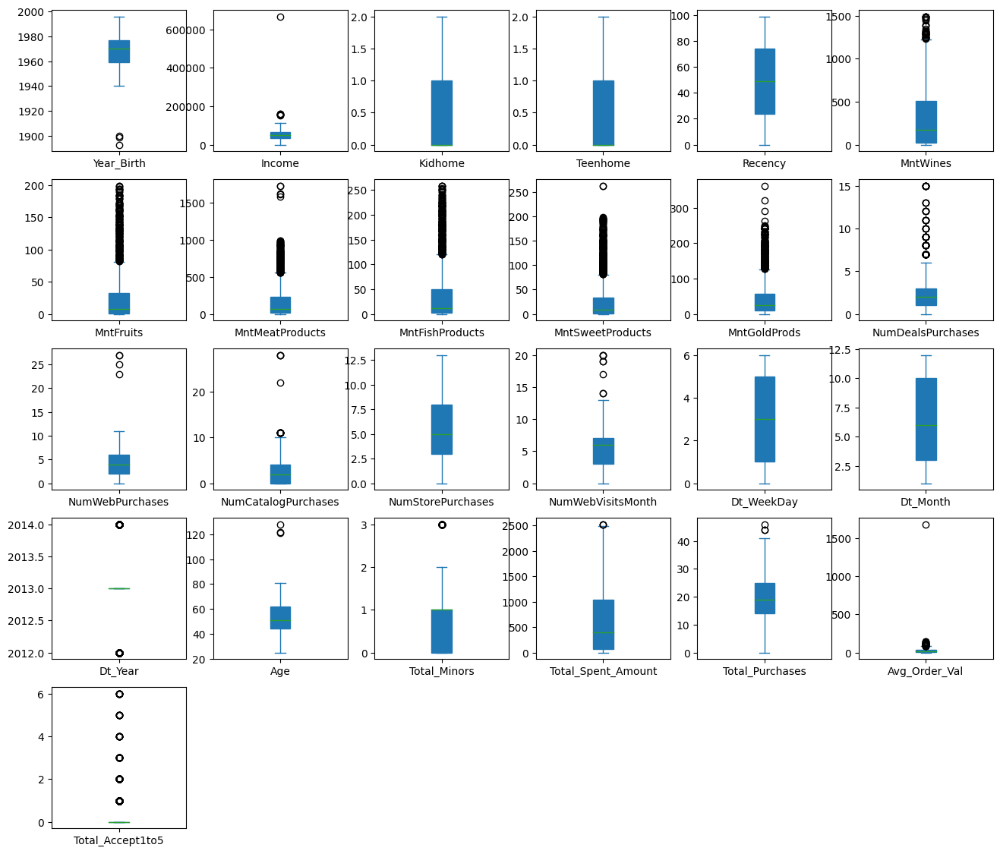

In [39]:
# selecting columns to plot

df_to_plot = cleaned_df.drop(columns=['ID', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3',
                              'AcceptedCmp4', 'AcceptedCmp5','Response',
                              'Complain']).select_dtypes(include=np.number)
# subplots
df_to_plot.plot(subplots=True, layout=(5,6), kind='box', figsize=(16,14), patch_artist=True)
plt.savefig('boxplots.png', bbox_inches='tight')

##### Insights
- In `Year_birth` column, it seems like there are entry errors since it is *not possible* that the people who was born before 1900 still alive.
- I'll remove those Outliers in `Year_birth` column.

In [40]:
cleaned_df.Year_Birth.describe()

count    2240.000000
mean     1968.805804
std        11.984069
min      1893.000000
25%      1959.000000
50%      1970.000000
75%      1977.000000
max      1996.000000
Name: Year_Birth, dtype: float64

##### Insights
 - Since Minimum year is 1893, I'll get such values in 'Year_birth' column which are greater than (Mean - 3*Std).
 - Remaining values will be removed.

In [41]:
# Removing outliers in year_birth
cleaned_df = cleaned_df[ cleaned_df.Year_Birth >= (cleaned_df.Year_Birth.mean() - 3*cleaned_df.Year_Birth.std()) ]
cleaned_df.Year_Birth.describe()

count    2237.000000
mean     1968.901654
std        11.701917
min      1940.000000
25%      1959.000000
50%      1970.000000
75%      1977.000000
max      1996.000000
Name: Year_Birth, dtype: float64

In [42]:
new_col.describe().T

,count,mean,std,min,25%,50%,75%,max
Dt_WeekDay,2240.0,3.022321,2.008789,0.000000,1.00,3.00000,5.000000,6.0
Dt_Month,2240.0,6.520089,3.512696,1.000000,3.00,6.00000,10.000000,12.0
Dt_Year,2240.0,2013.028125,0.684554,2012.000000,2013.00,2013.00000,2013.000000,2014.0
Age,2240.0,52.194196,11.984069,25.000000,44.00,51.00000,62.000000,128.0
Total_Minors,2240.0,0.950446,0.751803,0.000000,0.00,1.00000,1.000000,3.0
Total_Spent_Amount,2240.0,605.798214,602.249288,5.000000,68.75,396.00000,1045.500000,2525.0
Total_Purchases,2240.0,20.178571,7.293275,0.000000,14.00,19.00000,25.000000,46.0
Avg_Order_Val,2240.0,inf,NaN,0.228571,5.00,17.18609,39.049654,inf
Total_Accept1to5,2240.0,0.324554,0.810011,0.000000,0.00,0.00000,0.000000,6.0


##### Insights
- After observing the newly derived columns, we concluded that
> **Mean** and **Maximum** value of the **'Avg_Order_Val'** comes out to be **Infinite** that is problematic. Since it is an **outlier**, so we can remove this. 

In [43]:
# Finding the rows containing Inf value (outlier)

max_row_index = new_col['Avg_Order_Val'].idxmax()
max_row_index

655

In [44]:
# Removing the Outlier (row with index 655)

# Replace 'inf' values with 'NaN'
cleaned_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Remove rows containing 'NaN' values
cleaned_df.dropna(axis=0, inplace=True)

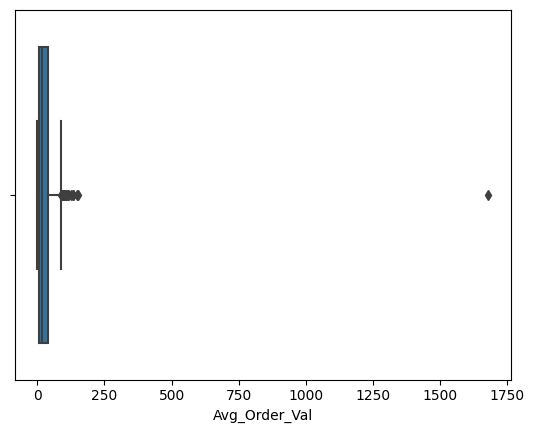

In [45]:
sns.boxplot(x=cleaned_df['Avg_Order_Val'])
plt.show()

In [46]:

col = np.array(cleaned_df['Avg_Order_Val'])
Q1 = np.percentile(col, 25)
Q3 = np.percentile(col, 75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = np.where((col < lower_bound) | (col > upper_bound))

print("Outliers:", col[outliers])


Outliers: [ 107.75        113.11764706   92.26315789   92.43478261  104.375
  101.68421053   91.73684211   96.2          91.72222222  106.66666667
   90.69565217  150.13333333  100.4         101.3125      125.91666667
  102.47368421   98.36842105  100.75         95.66666667  100.9
   94.76190476   97.71428571   91.30769231  115.1          95.5
   90.85714286   99.38888889  146.23076923   96.18181818   90.73913043
  103.44444444  100.4         114.16666667  132.89473684   95.36842105
   96.           91.16         93.63157895  103.44444444  101.42857143
   93.84        108.5         115.1          91.33333333   90.42857143
   95.94117647   92.11111111  132.89473684   94.63157895   90.46153846
   94.31578947   97.44444444   93.7826087    94.80952381  131.23529412
   89.85         92.58823529   94.04166667   94.55555556   92.43478261
   98.52380952  105.3125      100.5          93.5          91.1
   97.28571429   99.63157895 1679.        ]


In [47]:
cleaned_df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2235.0,5588.241163,3244.414707,0.000000,2827.5,5454.000000,8423.500000,11191.0
Year_Birth,2235.0,1968.907830,11.698867,1940.000000,1959.0,1970.000000,1977.000000,1996.0
Income,2235.0,52135.056376,24863.268008,1730.000000,35482.0,51381.000000,68211.000000,666666.0
Kidhome,2235.0,0.444743,0.538544,0.000000,0.0,0.000000,1.000000,2.0
Teenhome,2235.0,0.506935,0.544626,0.000000,0.0,0.000000,1.000000,2.0
Recency,2235.0,49.074273,28.951196,0.000000,24.0,49.000000,74.000000,99.0
MntWines,2235.0,304.266219,336.603237,0.000000,24.0,174.000000,504.500000,1493.0
MntFruits,2235.0,26.293065,39.726544,0.000000,1.5,8.000000,33.000000,199.0
MntMeatProducts,2235.0,167.064877,225.707839,0.000000,16.0,67.000000,232.000000,1725.0
MntFishProducts,2235.0,37.555705,54.653428,0.000000,3.0,12.000000,50.000000,259.0


In [48]:
# Finding the rows containing Inf value (outlier)
col_AOV = cleaned_df['Avg_Order_Val']
max_row_index = col_AOV.idxmax()

print("Index of the maximum value in 'Avg_Order_Val':", max_row_index)

Index of the maximum value in 'Avg_Order_Val': 2228


In [49]:
col_AOV = cleaned_df['Avg_Order_Val']
max_value = col_AOV.max()

print("Maximum value in 'Avg_Order_Val':", max_value)

Maximum value in 'Avg_Order_Val': 1679.0


##### Insights
> So we can conclude that we've removed the outlier in `Avg_Order_Val` column. We can proceed further.

# ***Visualization***

## Univariate Analysis

### Age

Text(0.5, 1.0, 'Age')

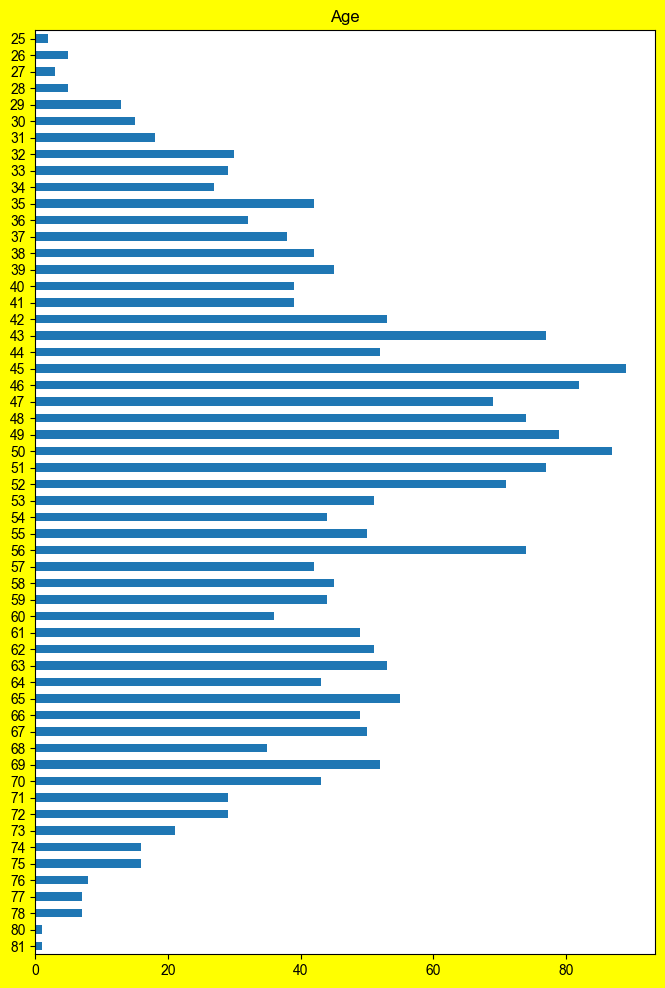

In [50]:
# plotting the bar_graph of the feature "Age" to find the Target Age_group
plt.figure(figsize=(8,12),facecolor='yellow')
cleaned_df['Age'].value_counts().sort_index(ascending=False).plot(kind='barh')
sns.set_theme(style='darkgrid')
plt.title('Age')

##### Insights
- Most of the customers lies between the range of 45-56 years old.
- Mid-Age(45-56 years old) customers are more inclined in buying the products as compared to others.


### Income

Text(0.5, 1.0, 'Income')

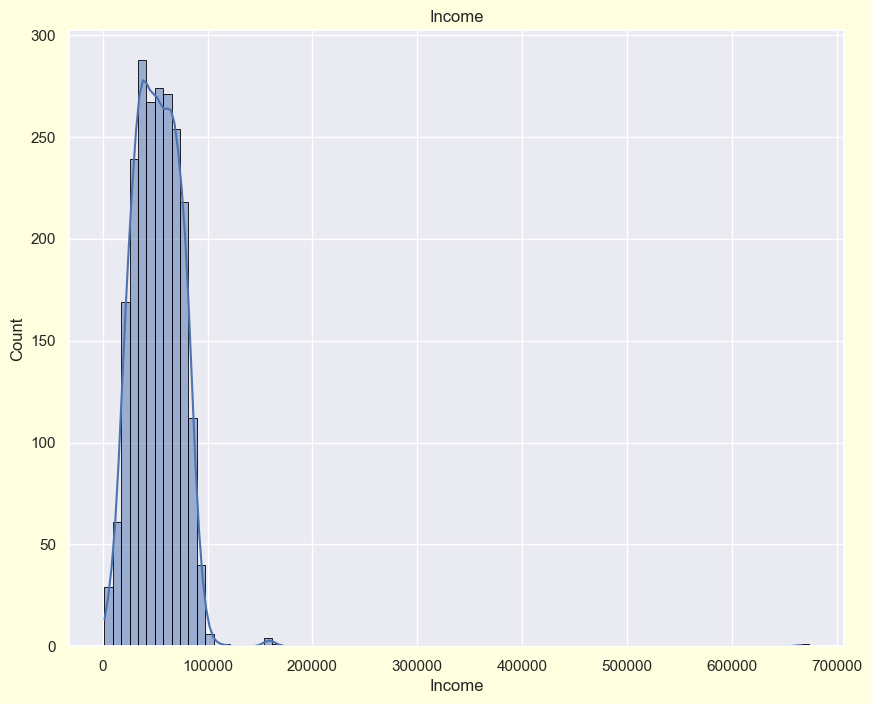

In [51]:

plt.figure(figsize=(10,8), facecolor='lightyellow')

ax = sns.histplot(data=cleaned_df, x='Income', binwidth=8000, kde=True, edgecolor='black')
ax.set_title('Income')

##### Insights
- Most of the customers have the income lying in between the range of 30k–80k.

> Using Matplotlib's **annotate function** and  passing the coordinates where the annotation shall be done
   - **x-coordinate**:- bar.get_x() + bar.get_width() / 2
   - **y-coordinate**:- bar.get_height()
   - **free space** to be left to make graph pleasing: (0, 8)
   - **ha** and **va** stand for the horizontal and vertical alignment

### Eduaction

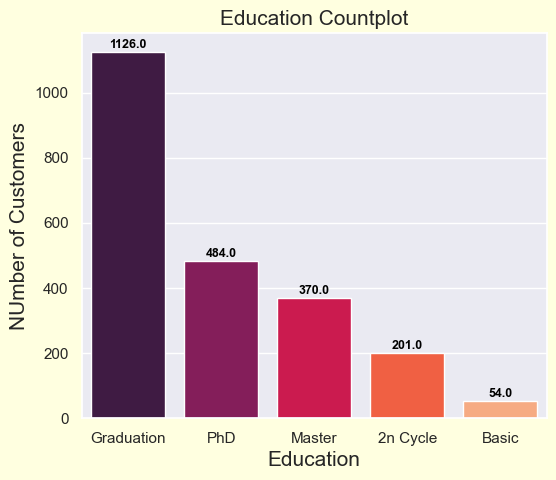

In [52]:

plt.figure(figsize=(6,5), facecolor='lightyellow')

plots = sns.countplot(data=cleaned_df, x ='Education',saturation=1, palette='rocket',order=cleaned_df['Education'].value_counts().index)
# Iterating over the bars one-by-one
for b in plots.patches:
    plots.annotate(format(b.get_height()),
                   (b.get_x() + b.get_width() / 2,
                    b.get_height()), ha='center', va='center',
                   fontsize=9, xytext=(0, 5),
                   textcoords='offset points',color='black',fontweight='bold')
sns.set_style("white")
plt.xlabel("Education", size=15)
plt.ylabel("NUmber of Customers", size=15)
plots.set_title('Education Countplot',size=15)
plt.show()

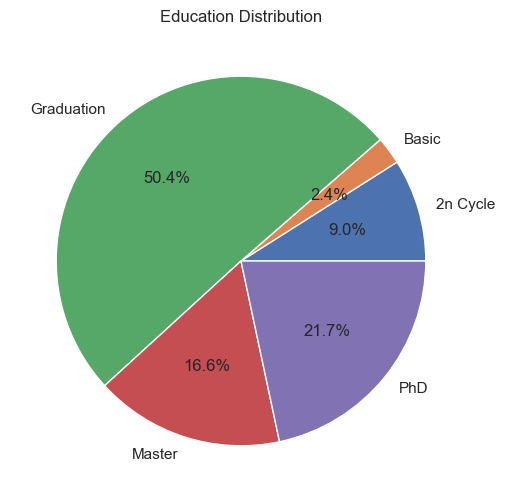

In [53]:
Education_by_category = cleaned_df.groupby('Education').size().reset_index(name='Count')

# Create a pie chart
fig, ax = plt.subplots(figsize=(8, 6))
ax.pie(Education_by_category['Count'], labels=Education_by_category['Education'], autopct='%1.1f%%')

# Title for the pie chart
ax.set_title('Education Distribution')

plt.show()

##### Insights
- Firstly, Majority of the customers are from The Graduation education background.
- Secondly, followed by majority graduation education backround customers are from PhD and Master education background.

### Marital_status

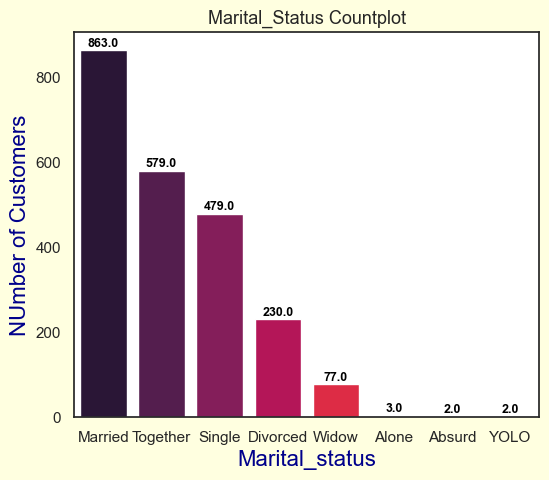

In [54]:

plt.figure(figsize=(6,5), facecolor='lightyellow')

plots = sns.countplot(data=cleaned_df, x ='Marital_Status',saturation=1, palette='rocket',
                      order=cleaned_df['Marital_Status'].value_counts().index)
# Iterating over the bars one-by-one
for b in plots.patches:
    plots.annotate(format(b.get_height()),
                   (b.get_x() + b.get_width() / 2,
                    b.get_height()), ha='center', va='center',
                   fontsize=9, xytext=(0, 5),
                   textcoords='offset points',color='black',fontweight='bold')
sns.set_style("white")
title_font = {'size': 16, 'color': 'darkblue'}
plt.xlabel("Marital_status", fontdict=title_font)
plt.ylabel("NUmber of Customers", fontdict=title_font)
plots.set_title('Marital_Status Countplot',size=13)
plt.show()

##### Insights
 > **Largest category** of the buyers are **Married** followed by Together, Single.

### Total Minors at home

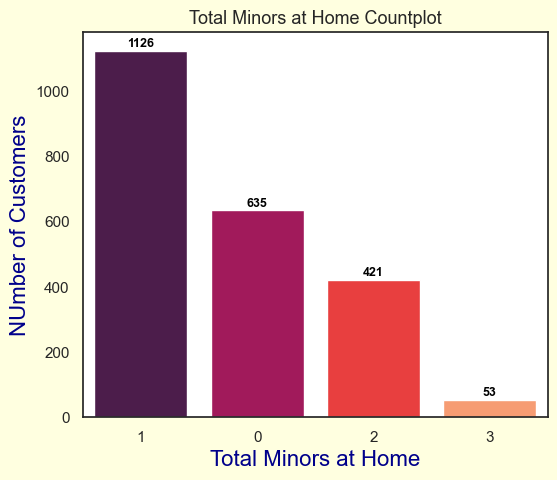

In [55]:

plt.figure(figsize=(6,5), facecolor='lightyellow')

plots = sns.countplot(data=cleaned_df, x ='Total_Minors',saturation=1, palette='rocket',
                      order=cleaned_df['Total_Minors'].value_counts().index)
# Iterating over the bars one-by-one
for b in plots.patches:
    plots.annotate(format(b.get_height().astype('int64')),
                   (b.get_x() + b.get_width() / 2,
                    b.get_height()), ha='center', va='center',
                   fontsize=9, xytext=(0, 5),
                   textcoords='offset points',color='black',fontweight='bold')
sns.set_style("white")
title_font = {'size': 16, 'color': 'darkblue'}
plt.xlabel("Total Minors at Home", fontdict=title_font)
plt.ylabel("NUmber of Customers", fontdict=title_font)
plots.set_title('Total Minors at Home Countplot',size=13)
plt.show()

##### Insights
> Most of the Customers have **Single-child** at home, followed by NO child at home.

## Bivariate Analysis

In [56]:
bivar = cleaned_df.drop(columns=['ID','Kidhome','Teenhome', 'Dt_Customer','NumWebVisitsMonth'])
sns.pairplot(bivar, height=4
           )

#### Plotting Correlation Heatmap to draw some Insights

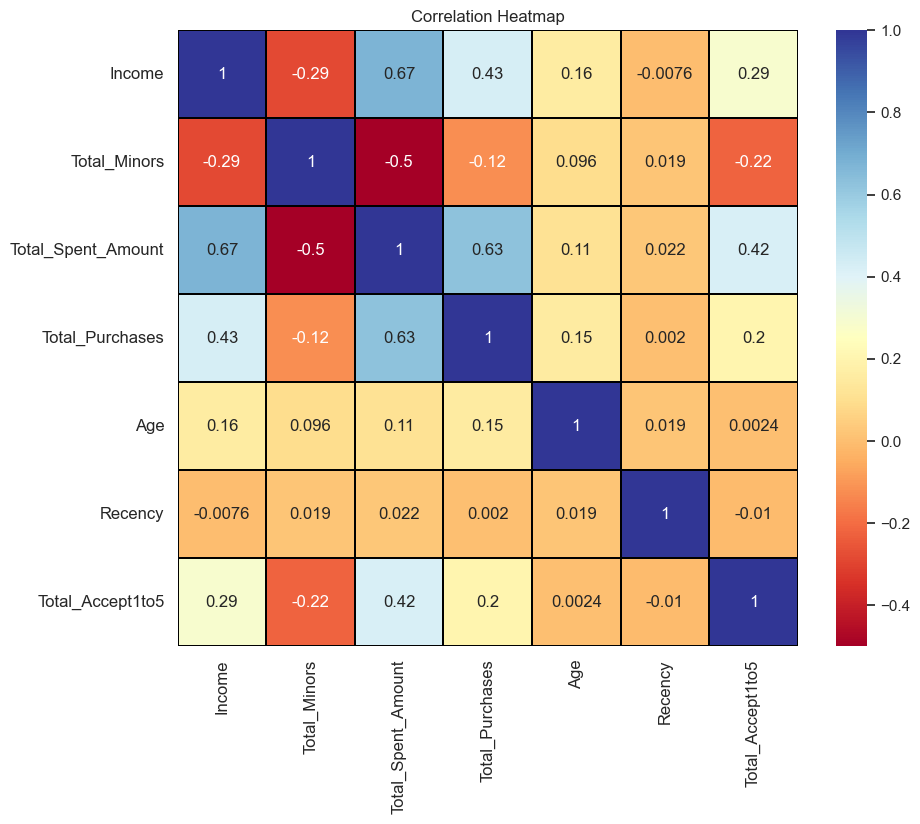

In [57]:
# Plotting Heatmap
plt.figure(figsize=(10,8))
hm = sns.heatmap(cleaned_df[['Education','Marital_Status','Income',
                             'Total_Minors','Total_Spent_Amount',
                             'Total_Purchases','Age','Recency',
                             'Total_Accept1to5',]].corr(),
                 cmap='RdYlBu',
                 linewidths=0.01,
                 linecolor='black',
                 annot=True)
hm.set_yticklabels(hm.get_yticklabels(), rotation = 0, fontsize = 12)
hm.set_xticklabels(hm.get_xticklabels(), rotation = 90, fontsize = 12)
bottom, top = hm.get_ylim()
plt.title("Correlation Heatmap")
plt.savefig('correlation_heatmap.png', bbox_inches='tight')
plt.show()

##### Insights
- There is strong Positive correlation 0.66 between 'Income' and 'Total_Spent_Amount'.
- There is strong Negative correlation 0.5 between 'Total_Minors' and 'Total_Spent_Amount'.

In [ ]:
# Boxplot between Complains and Total_Spent_Amount
cleaned_df.plot(x='Complain',y='Total_Spent_Amount', kind='scatter')
sns.set_style("darkgrid")
title_font = {'size': 16, 'color': 'darkblue'}
plt.xlabel("Complain", fontdict=title_font)
plt.ylabel("Total Spent Amount", fontdict=title_font)
plt.title('Complains v/s Total_Spent_Amount')
plt.show()

##### Insights
 - Surprisingly it is clearly visible that very few customer have complained.
 - So, we can conclude that customers have NO complaining tendency towards the product.

In [ ]:
from scipy.stats import pearsonr

r, p_value  =  pearsonr(x=cleaned_df['Complain'], y=cleaned_df['Total_Spent_Amount'])

# print results
print('Pearson correlation (r): ', r)
print('Pearson p-value: ', p_value)

##### Question 
 - Is there any tendancy that a customer visiting a company's website would likely purchase from the Website ?

In [ ]:
# Visualizing the NumWebPurchases v/s NumWebVisitsMonth
cleaned_df.plot(x='NumWebPurchases', y='NumWebVisitsMonth', kind='scatter')
sns.set_style("white")
plt.title("NumWebPurchases vs NumWebVisitsMonth")

> Clearly there is NO correlation between NumWebPurchases and NumWebVisitsMonth.
 - Hence we can conlcude that it's not always TRUE that a customer visiting the Website is likely purchasing the product

In [ ]:
store_shoppers = cleaned_df[cleaned_df.NumStorePurchases>0]

# To keep only those rows where the 'Avg_Order_Val' is within Three std deviations of the mean.
store_shoppers = store_shoppers[store_shoppers.Avg_Order_Val <= (store_shoppers.Avg_Order_Val.mean()+3*store_shoppers.Avg_Order_Val.std())]
store_shoppers['Type of shopper'] = "In-store"

# Customers purchasing from Other options in place of Stores
other_shoppers = cleaned_df[cleaned_df.NumStorePurchases==0]
other_shoppers['Type of shopper'] = "Other"

In [ ]:
# Calculate the average order volume for in-store shoppers and other shoppers
avg_order_values = all_shoppers.groupby('Type of shopper')['Avg_Order_Val'].mean().reset_index()

plt.figure(figsize=(5, 6))
sns.barplot(data=avg_order_values, x='Type of shopper', y='Avg_Order_Val', palette="Blues")
title_font = {'size': 16, 'color': 'darkblue'}
plt.title("Average Order Volume Comparison", fontdict=title_font)
plt.xlabel("Type of Shopper", fontdict=title_font)
plt.ylabel("Average Order Volume", fontdict=title_font)
plt.savefig('Avg_Order_Val_Bar.png', bbox_inches='tight')


##### Insights
 > Yes, people tends to purchases **more from Stores** rather than from other platforms.

In [ ]:
# Visualize Average Order Volume and NumStorePurchases
all_shoppers.plot(x='NumStorePurchases', y='Avg_Order_Val', kind='scatter')
sns.set_style("darkgrid")
title_font = {'size': 16, 'color': 'darkblue'}
plt.title("Average Order Value vs NumStorePurchases", size = 14)
plt.xlabel("NumberStorePurchases", fontdict=title_font)
plt.ylabel("Average Order Volume", fontdict=title_font)
plt.savefig('Average Order Value vs NumStorePurchases.png', bbox_inches='tight')

##### What else can we do ?
 - Since those who study are much likely to consume Fish which may result good amount spent on fish
      (Fish has **Omega 3 fatty acids** which is known to be good for the **brain**).
 - We can try to find which category of the students spend more on buying fish ?

In [ ]:
# divide the data into Three groups: Graduation, Masters and PhD
phd = cleaned_df[(cleaned_df.Education == "PhD")]
phd['label'] = "PhD"

grad = cleaned_df[(cleaned_df.Education == "Graduation")]
grad['label'] = "Graduation"
              
master = cleaned_df[(cleaned_df.Education == "Master")]
master['label'] = "Masters"

df_combined = phd.append([grad, master], ignore_index=True)
plt.figure(figsize = (6, 7))
sns.set_style("white")
title_font = {'size': 16, 'color': 'darkblue'}
plt.title("Graduation v/s Masters v/s PhD")
sns.boxplot(data = df_combined, x = 'label', y = 'MntFishProducts')
plt.xlabel("Education", size=16, fontdict=title_font)
plt.ylabel("Amount spent on fish products", size=16, fontdict=title_font)

##### Insights

     So, with help of visualiation of boxplots we conclude that :  
            
       - 1)  The median amount spent on fish products is highest for people with a Graduation degree, followed by people with a Masters degree, and then people with a PhD degree.
       
       - 2) The typical person with a Graduation degree spends more on fish products than the typical person with a Masters or a PhD degree.

In [ ]:
from scipy.stats import ttest_ind

# Assuming you have dataframes phd, master, and grad with MntFishProducts data

# Compare phd and grad
t_stat_phd_grad, pval_phd_grad = ttest_ind(phd.MntFishProducts, grad.MntFishProducts)
print("T-test p-value for phd vs. grad: ", pval_phd_grad)

# Compare master and grad
t_stat_master_grad, pval_master_grad = ttest_ind(master.MntFishProducts, grad.MntFishProducts)
print("T-test p-value for master vs. grad: ", pval_master_grad)

##### Insights
- 1) The p-value of approximately **2.1054946826981915e-08** for the t-test comparing the "PhD" and "Graduation" groups is **extremely small**, much less than the typical significance level of 0.05.
- 2) The p-value of **0.001191946** for the t-test comparing the "Masters" and "Graduation" groups is **extremely small**, much less than the typical significance level of 0.05.
> This indicates strong evidence to **reject the null hypothesis**. In other words, there is a significant difference in the means of "MntFishProducts" between the "PhD" & "Graduation" **and** "Masters" & "Graduation" groups. 

### Marketing Campaign

In [ ]:
# Merging all the Campiagn's responses
tcmp = cleaned_df[['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2','Response']]

tcmp.sum().sort_values().plot.barh(edgecolor='black')
plt.title("Successful Marketing Campaign?")
title_font = {'family': 'sans-serif', 'size': 16, 'color': 'darkblue'}
plt.xlabel("Count of Accepted offer", fontdict=title_font);
plt.ylabel("Campaign", fontdict=title_font)
plt.savefig('Successful Marketing Campaign.png', bbox_inches='tight')
plt.show()

##### Insights
> Clearly the last marketing campaign ('Response') was most successful.

- Now that we've established the **last campaign** as the most successful one, it's time to delve deeper into understanding the distinctions in both customer characteristics and purchasing behaviors. We'll be **comparing the latest one, with the aggregate of campaigns 1 to 5**.

> The characteristics we'll be examining include **'Year_Birth'**, **'Income'**, **'Minorhome'**, **'Join_month'**, and **'Join_weekday'**.

> On the other hand, the **purchase behaviors** we're interested in encompass various aspects:

- **Products**: 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', and 'MntSweetProducts'.
                  
- **Channels**: 'NumWebPurchases', 'NumCatalogPurchases', and 'NumStorePurchases'.
- **Overall metrics**: 'Total_Mnt', 'Total_num_purchase', and 'Average Order Value'.

This analysis will shed light on what sets the most successful campaign apart in terms of both customer attributes and their purchasing patterns.

In [ ]:
# creating 2 groups that accepted the offers from the last campaign and the campaign 1-5
cp_last = cleaned_df[cleaned_df.Response > 0]
cp_the_rest = cleaned_df[cleaned_df.Total_Accept1to5 > 0]
cp_last.shape[0], cp_the_rest.shape[0]

> **To isolate** the unique characteristics of each group, we will **eliminate** customers who accepted offers from both cp_last and cp_the_rest

In [ ]:
cp_the_rest2 = cp_the_rest
for i in list(cp_the_rest.ID):
    if i in list(cp_last.ID):
        cp_the_rest2 = cp_the_rest2[cp_the_rest2.ID != i]
        
cp_last.shape[0], cp_the_rest2.shape[0]

In [ ]:
cleaned_df.columns

In [ ]:
# Check the column names in cp_last
print(cp_last.columns)


In [ ]:
# Define a list of columns to select
columns_to_select = ['Year_Birth', 'Income', 'Total_Minors', 'Dt_Month', 'Dt_WeekDay',
                     'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
                     'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
                     'Total_Spent_Amount', 'Total_Purchases', 'Avg_Order_Val']

# Select the columns for cp_last
cp_last = cp_last[columns_to_select]

# Select the columns for cp_the_rest
cp_the_rest = cp_the_rest[columns_to_select]

# Select the columns for cleaned_df2
cleaned_df2 = cleaned_df[columns_to_select]

In [ ]:
# Finding the mean for cp_last and cleaned_df2
last = cp_last.mean()
cmp_1to5 = cp_the_rest.mean()
new = cleaned_df2.mean()

# Setting the display format for floating-point numbers to two decimal places.
pd.options.display.float_format = '{:.2f}'.format

In [ ]:
last

In [ ]:
# visualize the differences in last campaign v/s Average customer
plt.figure(figsize = (9, 6))
value1 = pd.DataFrame(( (cp_last.mean() - cleaned_df2.mean()) / cleaned_df2.mean())*100)
value1.dropna(inplace = True)
value1.sort_values(by=0,inplace = True)
value1['positive'] = value1[0] >=0
value1[0].plot(kind='barh', color=value1.positive.map({True: 'navy', False: 'orange'}))
sns.set_style("white")
plt.xlabel("Difference in %", fontdict=title_font)
plt.ylabel("Characteristics", fontdict=title_font)
plt.title("Customer Characteristics Comparison - Customer in last campaign vs Average customer",size=16)

In [ ]:
cmp_1to5

In [ ]:
# visualize the differences
plt.figure(figsize = (9, 7))
value = pd.DataFrame((((cp_last.mean()) - cp_the_rest2.mean()) / cp_the_rest2.mean())*100)
value.dropna(inplace = True)
value.sort_values(by=0,inplace = True)
value['positive'] = value[0] >=0
value[0].plot(kind='barh', color=value.positive.map({True: 'navy', False: 'orange'}))
plt.title("Customer Characteristics Comparison - The last campaign vs Campaign 1-5", fontdict={'size':13,'color':'black'})
plt.xlabel("Difference in %",fontdict=title_font)
plt.ylabel("Characteristics", fontdict=title_font)
plt.savefig('Customer Characteristics Comparison - The last campaign vs Campaign 1-5', bbox_inches='tight');

In [ ]:
# Selecting the columns to plot correlation-heatmap

# Only those rows where the "Avg_Order_Val" values aren't considered outliers based on the criterion of being within three standard deviations of the mean.
# Outliers (values beyond this threshold) will be filtered out.
cleaned_df2 = cleaned_df[cleaned_df.Avg_Order_Val <= (cleaned_df.Avg_Order_Val.mean()+3*cleaned_df.Avg_Order_Val.std())]
cleaned_df2.replace([np.inf, -np.inf], 0, inplace=True)

# Removing values of "Total_num_purchase" that are considered outliers based on the criterion of being within three standard deviations of the mean.
cleaned_df2 = cleaned_df2[cleaned_df2.Total_Purchases <= (cleaned_df2.Total_Purchases.mean()+3*cleaned_df2.Total_Purchases.std())]
cleaned_df2 = cleaned_df2[cleaned_df2.Total_Spent_Amount <= (cleaned_df2.Total_Spent_Amount.mean()+3*cleaned_df2.Total_Spent_Amount.std())]

df_to_plot = cleaned_df2[['Income', 'Total_Spent_Amount','Total_Purchases', 'Avg_Order_Val']]

# creating heatmap
plt.figure(figsize = (9, 7))
s = sns.heatmap(df_to_plot.corr(),  annot = True,cmap = 'RdBu', linewidths=0.01, linecolor='white', vmin = -1, vmax = 1,center = 0)
s.set_yticklabels(s.get_yticklabels(), rotation = 0, fontsize = 12)
s.set_xticklabels(s.get_xticklabels(), rotation = 90, fontsize = 12)
bottom, top = s.get_ylim()
s.set_ylim(bottom + 0.5, top - 0.5)
plt.title("Correlation Heatmap")
plt.savefig('heatmap2.png', bbox_inches='tight')
plt.show()

#### Encoding

In [ ]:
# Creating a copy of dataset
train_encoded = cleaned_df.copy(deep=True)

In [ ]:
# Importing onehotencoder
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder()

In [ ]:
# Fit and transform the selected categorical columns and convert to an array
encoded_train = encoder.fit_transform(train_encoded[['Education', 'Marital_Status']])

# Convert the encoded_train array to a DataFrame with appropriate column names
encoded_train_dataset = pd.DataFrame(encoded_train, columns=encoder.get_feature_names_out(input_features=['Education', 'Marital_Status']))
encoded_train_dataset.sample(5)

In [ ]:
train_encoded=pd.concat([encoded_train_dataset,train_encoded,],axis=1)
train_encoded.columns

In [ ]:
train_encoded.drop(['Education', 'Marital_Status'],axis=1,inplace=True)
train_encoded.sample(20)

In [ ]:
train_encoded.isnull().sum()

In [ ]:
null_row_index = train_encoded[train_encoded.isnull().any(axis=1)].index

print("Row Indices Containing Null Values:")
print(null_row_index)

> There are total 10 rows having Null values.

In [ ]:
train_encoded.dropna()

In [ ]:
train_balance = train_encoded.copy(deep=True)

### Feature Engineering

In [ ]:
rd_df = train_balance.drop(columns=['ID', 'Dt_Customer','AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response'])
rd_df.replace([np.inf, -np.inf], 0, inplace=True)

# One-hot encoding
rd_df = pd.get_dummies(rd_df)

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
profile=ProfileReport(new_df,explorative=True)
profile.to_file('output report Customer Personality Analyisis.html')

### Splitting the Data

In [ ]:
# Import train_test_split function
from sklearn.model_selection import train_test_split

X=rd_df.drop(columns=['Total_Accept1to5'])  # Independent features
y=rd_df['Total_Accept1to5']  # Target features

# Splitting dataset into training dataset and test dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=20)


> We've splitted the dataset into **70% training** and **30% testing**

### *1 Logisitic Regression*

> *Checking the Assumptions*

#### (i) Target Variable is Non-Binary

In [ ]:
n = pd.unique(train_balance['Response'])
print("Distinct values of target variable : ", n)
sns.countplot(x='Response',data=train_balance, palette='hls')

#### (ii) Multicollinearity

In [ ]:

def vif_score(dataframe):
    from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
    
    dataframe = dataframe.fillna(0)
    variables = list(dataframe.columns)
    vif_data = pd.DataFrame()
    vif_data["feature"] = variables
    vif_data["VIF"] = [vif(dataframe[variables].values, i) for i in range(len(variables))]
    vif_data = vif_data.sort_values(['VIF'], ascending=False)
    return vif_data

In [ ]:
vif_score(X)

## *Regression Analysis*

In [ ]:
from scipy import stats

### 1. Assumption of Linearity

In [ ]:
for col in X_train.columns:
    plt.figure(figsize=(16,4))
    plt.subplot(131)
    sns.histplot(X_train[col])
    plt.title(col)
    plt.subplot(132)
    stats.probplot(X_train[col],dist ='norm',plot = plt)
    plt.title(col)
    plt.subplot(133)
    sns.regplot(x=X_train[col],y=y_train)
    plt.title(col)

### 2. Assumption of Multicollinearity

> (1) **Covariance Matrix**

In [ ]:
rd_df.corr()

In [ ]:
# Plotting Heatmap
plt.figure(figsize=(35,18))
hm = sns.heatmap(X.corr(), cmap='RdYlGn',
                 linewidths=0.01, linecolor='white',annot=True)
hm.set_yticklabels(hm.get_yticklabels(), rotation = 0, fontsize = 12)
hm.set_xticklabels(hm.get_xticklabels(), rotation = 90, fontsize = 12)
bottom, top = hm.get_ylim()
plt.title("Correlation Heatmap")
plt.show()

##### Insights
 - 

> (2) Variance Inflation Factor(**VIF**)

In [ ]:
# VIF function for each feature to assess multicollinearity among the indep. variables

from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
def vif_score(dataframe):
    """
    Calculate the Variance Inflation Factor (VIF) for each feature in a DataFrame.

    Parameters:
    dataframe (pandas.DataFrame): The DataFrame containing the independent variables.

    Returns:
    pandas.DataFrame: A DataFrame with feature names and their corresponding VIF values.
    """
    variables = list(dataframe.columns)
    
    vif_data = pd.DataFrame()
    vif_data["feature"] = variables
    vif_data["VIF"] = [vif(dataframe[variables].values, i) for i in range(len(variables))]
    vif_data=vif_data.sort_values(['VIF'],ascending=False)
    return vif_data

In [ ]:
vif = vif_score(X_train)
vif

## Standardization of Dataset

***StandardScaler***

> We'll be using **StandardScaler** to standardize or normalize features, ensuring they've a mean of 0 and a std. dev. of 1
- **StandardScaler** helps in **algorithm convergence**, **reduces** sensitivity to **outliers**, and **improves model performance**.

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

scaled_train=scaler.fit_transform(X_train)
scaled_test=scaler.transform(X_test)

In [ ]:
scaled_train=pd.DataFrame(X_train,columns=X.columns)
scaled_train

In [ ]:
scaled_test=pd.DataFrame(X_test,columns=X.columns)
scaled_test

### GaussianNB Regression Model
> GaussianNB is primarily a **classification algorithm** based on the Gaussian Naive Bayes approach, which models the **probability distribution** of data for class prediction.

### 1. Independence of Features

In [ ]:
# Pairwise Feature Visualization

sns.pairplot(rd_df, hue='class_label')

In [ ]:
from sklearn.feature_selection import chi2, mutual_info_classif

# For categorical features
chi2_stat, p_values = chi2(X_categorical, y)

# For both categorical and continuous features
mutual_info_scores = mutual_info_classif(X, y)


In [ ]:
from sklearn.naive_bayes import GaussianNB
clf_nb = GaussianNB()
clf_nb.fit(scaled_train,y_train)

In [ ]:
from sklearn.metrics import accuracy_score 
y_pred=clf_nb.predict(scaled_test)

# Accuracy_score of the Model
accuracy_score(y_test,y_pred)*100

In [ ]:
#hyperparameter tuning concept
param_grid={"var_smoothing":[0.1, 0.001, 0.5,0.05,0.01,1e-8,1e-7,1e-6,1e-10,1e-11]}

from sklearn.model_selection import GridSearchCV
gs_nb = GridSearchCV(clf_nb,param_grid=param_grid,cv=5,verbose=3)

In [ ]:
gs_nb.fit(scaled_train, y_train)

In [ ]:
gs_nb.best_params_

In [ ]:
# with the Above best parameter ,i.e, var_smoothing=0.001, Again Applying GaussianNB
from sklearn.naive_bayes import GaussianNB
clf_nb1 = GaussianNB(var_smoothing=0.001)
clf_nb1.fit(scaled_train,y_train)

In [ ]:
# Again predicting the accuracy score
y_pred1=clf1.predict(scaled_test)
accuracy_score(y_test,y_pred1)*100

##### Insights
> Accuracy of our model has increased drastically after Hyperparameter-tuning.

### Random_Forest_Classifier
> Random Forest is an ensemble machine learning method that combines multiple decision tree classifiers by fitting them on different subsets of the data and averaging their predictions to enhance accuracy and reduce overfitting.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
clf_rf = RandomForestClassifier()
clf_rf.fit(scaled_train,y_train)
y_pred_rf=clf_rf.predict(scaled_test)
accuracy_score(y_test,y_pred_rf)*100

##### Insights
> Even if the accuracy of our model is really good from the last model. Still we'll try to increase our chances to get more accuracy.

In [ ]:
param_grid_rf = { "n_estimators": [50,70,100,130,170],
                    "max_depth": range(3,11,1),
                    "random_state":[0,50,100],
                     "criterion":['gini',"entropy"]
                     }

  - **n_estimators ( int, default=100 )** :- The number of trees in the forest.
  - **max_depth ( int, default=None )** :- The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.
  - **random_state ( int, RandomState instance or None, default=None )** :- It Controls both the randomness of the bootstrapping of the samples used when building trees (if bootstrap=True) and the sampling of the features to consider when looking for the best split at each node (if max_features < n_features). See Glossary for details.
  - **criterion ( {“gini”, “entropy”, “log_loss”}, default=”gini” )** :- The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “log_loss” and “entropy” both for the Shannon information gain. **Note**: This parameter is tree-specific

In [ ]:
gs_rf=GridSearchCV(clf_rf,param_grid=param_grid_rf,cv=5,verbose=3)

In [ ]:
# fitting_data
gs_rf.fit(scaled_train,y_train)

In [ ]:
#getting the best parameters
gs_rf.best_params_

In [ ]:
# getting the best score
gs_rf.best_score_

In [ ]:
# Prediction of train data set values
y_pred_train = clf_rf.predict(scaled_train)

In [ ]:
# Applying the best parameters
from sklearn.ensemble import RandomForestClassifier
clf_rf1=RandomForestClassifier(criterion='entropy', max_depth=10,
                               n_estimators=100, random_state=50)
clf_rf1.fit(scaled_train,y_train)
y_pred_rf1=clf_rf1.predict(scaled_test)
accuracy_score(y_test,y_pred_rf1)*100

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
# Confusion_matrix
print('Confusion_matrix is : ',confusion_matrix(y_test,y_pred_rf1))

In [ ]:
# Accuracy_score
print('Accuracy_score is : ',accuracy_score(y_test,y_pred_rf1))

##### Insights
   > Our Model's accuracy has Increased while we are using RandomForestClassifier after some tweaking with the help of Hyperparameter-Tuning.

### Logistic Regression Model

In [ ]:
# Using Logistic Regression Model

from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression

clf_lgr = LogisticRegression()
clf_lgr.fit(scaled_train,y_train)
y_pred_lgr=clf_lgr.predict(scaled_test)
accuracy_score(y_test,y_pred_lgr)*100

In [ ]:
# GridSearchCV
from sklearn.model_selection import GridSearchCV
parameters={'penalty':('l1','l2','elasticnet'),
           'C':[1,10,20,30],
           'solver' : ('lbfgs', 'liblinear', 'newton-cg',
                       'newton-cholesky', 'sag', 'saga')
           }
grid_clf = GridSearchCV(clf_lgr, param_grid = parameters,cv=5)


In [ ]:
#fitting the data

grid_clf.fit(scaled_train,y_train)

In [ ]:
# Best parameters
ran_clf.best_params_

In [ ]:
# getting the best score
ran_clf.best_score_

In [ ]:
clf_lgr = LogisticRegression(solver = 'liblinear', penalty =  'l1', C = 20)

In [ ]:
clf_lgr.fit(scaled_train,y_train)

In [ ]:
y_pred_grid = clf_lgr.predict(scaled_test)

In [ ]:
clf_lgr.predict_proba(scaled_test)

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
# Confusion_matrix
print('Confusion_matrix is : ',confusion_matrix(y_test,y_pred_grid))

In [ ]:
# Accuracy_score
print('Accuracy_score is : ',accuracy_score(y_test,y_pred_grid))

In [ ]:
print(classification_report(y_test,y_pred_grid))

### Metrics to measure Accuracy

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred_grid))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred_grid))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred_grid)))


### *Decision*

- **Accuracy** for different Models are :- 
  - GaussianNB 71.2369 
  - RandomForestClassifier 84.5
  - LogisticRegression 80.48
 > Accuracy for the RandomForestClassifier is higher than others.
 
- Now we'll proceed further with RandomForestClassifier

In [ ]:
# computing residuals
residuals_train = y_train.values - y_pred_train
residuals_test = y_test - y_pred_rf1

## Heteroscedasticity

In [ ]:
sns.regplot(x = y_pred_train, y = residuals_train)
plt.xlabel('Y_pred/predicted values')
plt.ylabel('Residuals')
plt.title('Residuals vs fitted values plot for Heteroscedasticity check')

In [ ]:
from scipy.stats import pearsonr

list_prod = ['MntWines', 'MntMeatProducts','MntGoldProds', 'MntFishProducts', 'MntFruits',  'MntSweetProducts']
for i in list_prod:
    r, p_value  =  pearsonr(x=new_df[i], y=new_df['Total_Accept'])
    print(i, "vs Total_Accept:")
    # print results
    print('Pearson correlation (r): ', r)
    print('Pearson p-value: ', p_value)
    print(" ")

In [ ]:
# find feature importance scores
import pandas as pd
feature_imp = pd.Series(clf_rf.feature_importances_,    #clf_rf:from RandomForest
        index = list(X.columns)).sort_values(ascending=False)

feature_imp = feature_imp[:10]

# Creating a bar plot
plt.figure(figsize = (7, 7))
sns.barplot(x=feature_imp[:10], y=feature_imp.index[:10])
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Factors')
plt.title("Top 10 Important Factors of Accepting Campaign Offers")
plt.savefig('important_feautres.png', bbox_inches='tight')
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Choose an appropriate average setting for precision and recall
precision = precision_score(y_test, y_pred_rf1, average='weighted')  # 'weighted' is just an example; choose the appropriate one
recall = recall_score(y_test, y_pred_rf1, average='weighted')  # 'weighted' is just an example; choose the appropriate one

f1 = f1_score(y_test, y_pred_rf1, average='weighted')  # 'weighted' is just an example; choose the appropriate one

print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
